In [23]:
# pip install opencv-python

Note: you may need to restart the kernel to use updated packages.


In [1]:
import pandas as pd
import numpy as np
import cv2
from tqdm import tqdm
tqdm.pandas()

In [2]:
data_train = pd.read_csv("train.csv")
data_test = pd.read_csv("test.csv")
data_sub = pd.read_csv("sample_submission.csv")
data_image = "../Project/Patika_Project2/Plant_Pathology_2020/images/"
data_train.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Train_0,0,0,0,1
1,Train_1,0,1,0,0
2,Train_2,1,0,0,0
3,Train_3,0,0,1,0
4,Train_4,1,0,0,0


In [3]:
data_test.head()

,image_id
0,Test_0
1,Test_1
2,Test_2
3,Test_3
4,Test_4


In [4]:
data_sub.head()

,image_id,healthy,multiple_diseases,rust,scab
0,Test_0,0.25,0.25,0.25,0.25
1,Test_1,0.25,0.25,0.25,0.25
2,Test_2,0.25,0.25,0.25,0.25
3,Test_3,0.25,0.25,0.25,0.25
4,Test_4,0.25,0.25,0.25,0.25


In [5]:
epochs = 20
sample_len = 100
def load_image(image_id):
    file_path = image_id + ".jpg"
    image = cv2.imread(data_image + file_path)
    return cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

train_images = data_train["image_id"][:sample_len].progress_apply(load_image)

100%|████████████████████████████████████████████████████████████████████████████████| 100/100 [00:03<00:00, 26.61it/s]



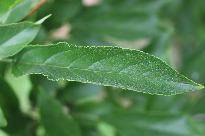

In [6]:
import plotly.express as px
import plotly.graph_objects as go
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
import matplotlib.pyplot as plt

fig = px.imshow(cv2.resize(train_images[4], (205, 136)))
fig.show()

#### İlk olarak bu veri seti görsel öğrenme sonucu içerik sunacak bir yapıdadır. Görselleri opencv ile okuyup gerekli bazı görsel kütüphanelerle bunların üzerinde işlem yapacağız.. Kaggle üzerindeki veri setinde toplam 800mb'lik 3 bin küsur görsel var. Eğitim amaçlı bunları indirdim ve kaggle üzerinde proje ile ilgilenen bireylerin yaptıklarından yola çıkıyorum.. Opencv bilgimin çok yeterli olmamasından mütevellit. 

In [7]:
red_values = [np.mean(train_images[idx][:, :, 0]) for idx in range(len(train_images))]
green_values = [np.mean(train_images[idx][:, :, 1]) for idx in range(len(train_images))]
blue_values = [np.mean(train_images[idx][:, :, 2]) for idx in range(len(train_images))]
values = [np.mean(train_images[idx]) for idx in range(len(train_images))]

#### Burada görsellerin belli noktalarındaki çizgilerinin ortalamasını aldık. Renklerle belirtme sebebimiz her rengin aslında bitkiyi tanımlayabilecek bölgeleri oluşturuyor olmasıdır. Kırmızı, yeşil ve mavi bölgelerin ortalamasını alıyoruz...

In [8]:
fig = ff.create_distplot([red_values], group_labels=["R"], colors=["red"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Kırmızı kanal değerlerinin dağılımı")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [9]:
fig = ff.create_distplot([green_values], group_labels=["G"], colors=["green"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Yeşil Kanal Değerlerinin Dağılımı")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [10]:
fig = ff.create_distplot([blue_values], group_labels=["B"], colors=["blue"])
fig.update_layout(showlegend=False, template="simple_white")
fig.update_layout(title_text="Mavi Kanal Değerlerinin Dağılımı")
fig.data[0].marker.line.color = 'rgb(0, 0, 0)'
fig.data[0].marker.line.width = 0.5
fig

In [11]:
fig = go.Figure()

for idx, values in enumerate([red_values, green_values, blue_values]):
    if idx == 0:
        color = "Red"
    if idx == 1:
        color = "Green"
    if idx == 2:
        color = "Blue"
    fig.add_trace(go.Box(x=[color]*len(values), y=values, name=color, marker=dict(color=color.lower())))
    
fig.update_layout(yaxis_title="Ortalama Değer", xaxis_title="Renk Kanalları",
                  title="Ortalama değerler ve Renk kanalları", template="plotly_white")

In [12]:
def visualize_leaves(cond=[0, 0, 0, 0], cond_cols=["healthy"], is_cond=True):
    if not is_cond:
        cols, rows = 3, min([3, len(train_images)//3])
        fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
        for col in range(cols):
            for row in range(rows):
                ax[row, col].imshow(train_images.loc[train_images.index[-row*3-col-1]])
        return None
        
    cond_0 = "healthy == {}".format(cond[0])
    cond_1 = "scab == {}".format(cond[1])
    cond_2 = "rust == {}".format(cond[2])
    cond_3 = "multiple_diseases == {}".format(cond[3])
    
    cond_list = []
    for col in cond_cols:
        if col == "healthy":
            cond_list.append(cond_0)
        if col == "scab":
            cond_list.append(cond_1)
        if col == "rust":
            cond_list.append(cond_2)
        if col == "multiple_diseases":
            cond_list.append(cond_3)
    
    data = data_train.loc[:99]
    for cond in cond_list:
        data = data.query(cond)
        
    images = train_images.loc[list(data.index)]
    cols, rows = 3, min([3, len(images)//3])
    
    fig, ax = plt.subplots(nrows=rows, ncols=cols, figsize=(30, rows*20/3))
    for col in range(cols):
        for row in range(rows):
            ax[row, col].imshow(images.loc[images.index[row*3+col]])
    plt.show()

### Healthy

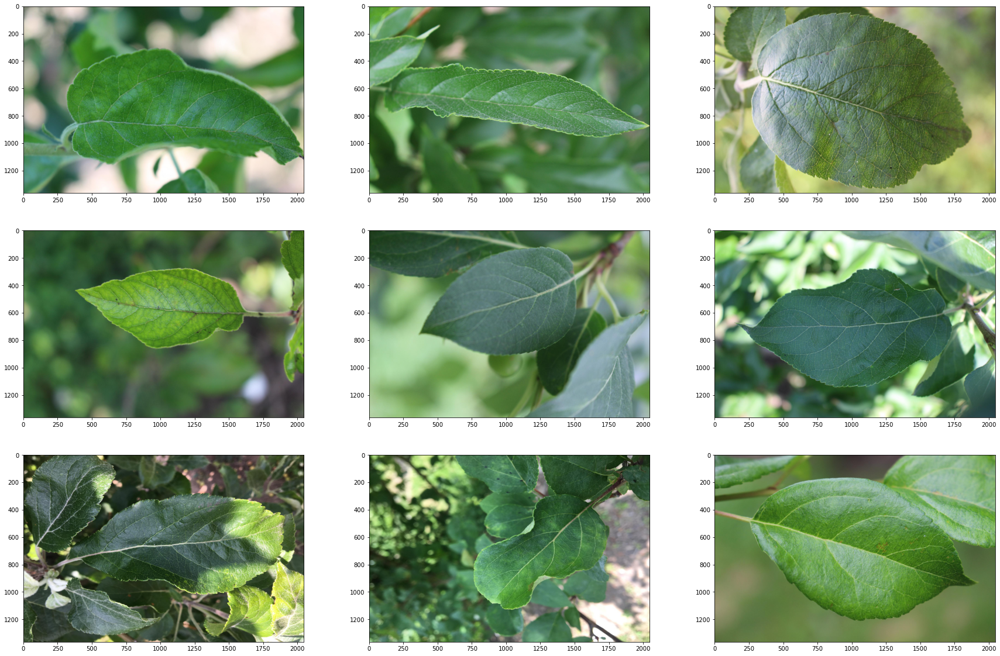

In [13]:
visualize_leaves(cond=[1, 0, 0, 0], cond_cols=["healthy"])

#### Sağlık bakımından sıralanmış bitki görselleri. Yukarıda her bir ölçekte bu veri setindeki görselleri incelemek için bir fonksiyon kurduk. Healthy, scab, rust ve multiple gibi kategorilerce görseller içerisinden arama gerçekleştirecek...

### Scab

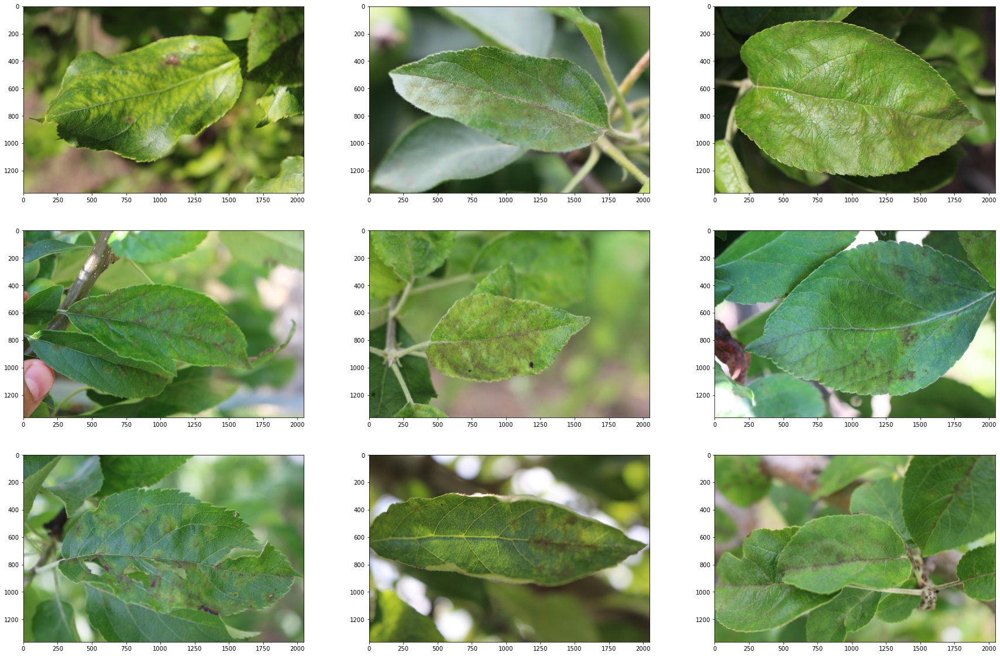

In [14]:
visualize_leaves(cond=[0, 1, 0, 0], cond_cols=["scab"])

#### Burada da kabuk bakımından görseller sınandı ve dokuz adet görsel çıkardı...

### Rust

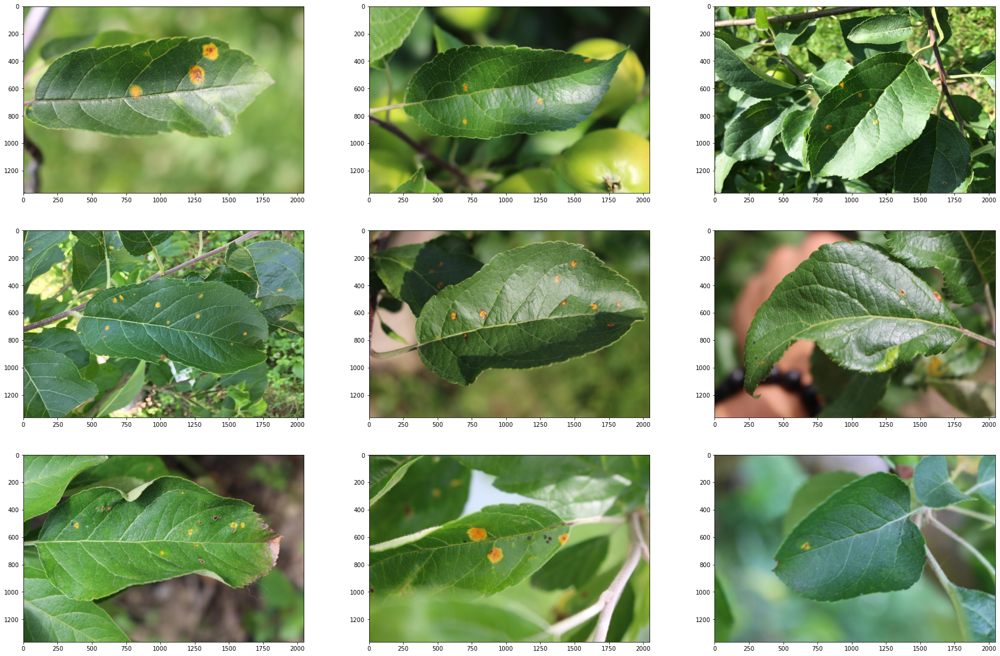

In [15]:
visualize_leaves(cond=[0, 0, 1, 0], cond_cols=["rust"])

#### Burada da paslanmış veya hasara uğramış görseller üzerinden gözlem yapma imkanımız doğuyor..

### Multiple Diseases

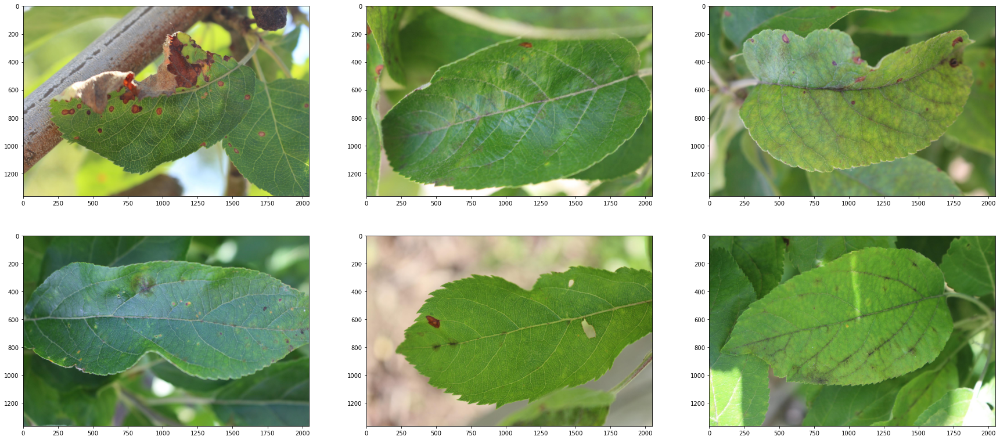

In [16]:
visualize_leaves(cond=[0, 0, 0, 1], cond_cols=["multiple_diseases"])

#### Çoklu hasara uğramış bitki görselleri.

#### Şimdi de artık model oluşturma, metriklerle sınama gibi yapıları bu veri seti üzerinden kontrol edelim... Fakat veri sadece 0 ve 1'lerden oluşuyor. Dolayısıyla pek tatmin olacağımız sonuçlara ulaşamayabiliriz. Aslında bu numeric değerleri categorical değerlere çevirip ardından classifacation modelleme gerçekleştirebiliriz fakat pek değişim olacağını sanmıyorum.

In [18]:
df = data_train.copy()
print(f" Veri setinin boyut sayısı: {df.ndim}\n",
     f"Veri setinin boyut bilgisi: {df.shape}\n",
     f"Veri setindeki toplam eleman sayısı: {df.size}\n")

 Veri setinin boyut sayısı: 2
 Veri setinin boyut bilgisi: (1821, 5)
 Veri setindeki toplam eleman sayısı: 9105



In [19]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1821 entries, 0 to 1820
Data columns (total 5 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   image_id           1821 non-null   object
 1   healthy            1821 non-null   int64 
 2   multiple_diseases  1821 non-null   int64 
 3   rust               1821 non-null   int64 
 4   scab               1821 non-null   int64 
dtypes: int64(4), object(1)
memory usage: 71.3+ KB


In [20]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
healthy,1821.0,0.283361,0.450754,0.0,0.0,0.0,1.0,1.0
multiple_diseases,1821.0,0.049973,0.217948,0.0,0.0,0.0,0.0,1.0
rust,1821.0,0.341571,0.474367,0.0,0.0,0.0,1.0,1.0
scab,1821.0,0.325096,0.468539,0.0,0.0,0.0,1.0,1.0


In [23]:
y_df = df[["healthy"]]
df.drop(["image_id","healthy"], axis = 1, inplace = True)
X_df = df

In [29]:
y_df.head()

,healthy
0,0
1,0
2,1
3,0
4,1


In [25]:
X_df.head()

,multiple_diseases,rust,scab
0,0,0,1
1,1,0,0
2,0,0,0
3,0,1,0
4,0,0,0


In [26]:
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

X_train, X_test, y_train, y_test = train_test_split(X_df, y_df, test_size = 0.30, random_state = 42)

### Random Forests - RF Modelleme:

#### Model ve Tahmin bölümü:

In [30]:
from sklearn.ensemble import RandomForestRegressor

rf_model = RandomForestRegressor().fit(X_train, y_train.values.ravel())
y_pred = rf_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.0

#### Model Tunning bölümü:

In [34]:
from warnings import filterwarnings
filterwarnings('ignore')
rf_params = {"max_depth": list(range(1,10)),
            "max_features": [3, 5, 10, 15],
            "n_estimators": [100, 200, 300, 500]}
rf_model = RandomForestRegressor(random_state=42)
rf_cv_model = GridSearchCV(rf_model, rf_params, cv=10, n_jobs=-1, verbose=2).fit(X_train, np.ravel(y_train,order='C'))
print(f"En iyi parametreler: {str(rf_cv_model.best_params_)}")

Fitting 10 folds for each of 144 candidates, totalling 1440 fits
En iyi parametreler: {'max_depth': 3, 'max_features': 3, 'n_estimators': 100}


In [36]:
rf_tuned = RandomForestRegressor(max_depth=3, max_features=3, n_estimators=100)
rf_tuned.fit(X_train, np.ravel(y_train, order = 'C'))
y_pred = rf_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.0

#### Bir model daha kuracağım eğer sonuç yine böyle çıkarsa veri setini bu şekilde tamamlayacağım..

### Gradient Boosting Machines - GBM Model

#### Model ve Tahmin bölümü:

In [41]:
from sklearn.ensemble import GradientBoostingRegressor
gbm_model = GradientBoostingRegressor().fit(X_train, y_train.values.ravel())
y_pred = gbm_model.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

1.1809963755282e-05

#### Model Tunning bölümü:

In [42]:
gbm_params = {"learning_rate": [0.001,0.01,0.1,0.2],
             "max_depth": [3,5,8,10,15],
             "n_estimators": [100,200,500,1000],
             "subsample": [1,0.5,0.75]}
gbm = GradientBoostingRegressor()
gbm_cv_model = GridSearchCV(gbm, gbm_params, cv = 10, n_jobs=-1, verbose=2).fit(X_train, y_train.values.ravel())
print(f"En iyi parametrelerimiz: {str(gbm_cv_model.best_params_)}")

Fitting 10 folds for each of 240 candidates, totalling 2400 fits
En iyi parametrelerimiz: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 100, 'subsample': 0.5}


In [43]:
gbm_tuned = GradientBoostingRegressor(learning_rate=0.2, max_depth=3, n_estimators=100, subsample=0.5)
gbm_tuned.fit(X_train, y_train)
y_pred = gbm_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

1.2933908250306654e-08

### Extreme Gradient Boosting - XGB Model

#### Model ve Tahmin bölümü:

In [44]:
# pip install xgboost

In [45]:
from xgboost import XGBRFRegressor
xgb = XGBRFRegressor().fit(X_train, y_train.values.ravel())
y_pred = xgb.predict(X_test)
np.sqrt(mean_squared_error(y_test,y_pred))

0.07909571259136784

#### ilkel parametrelere dayalı bir şekilde yaptığımız bu karşılaştırma bile iyi bir sonuç verdi..

#### Model Tunning bölümü:

In [50]:
# ?xgb Değer atayacağımız parametrelerini gözlemledik..
xgb_grid = {"colsample_bytree": [0.1, 0.2, 0.3, 0.4, 0.5],
           "n_estimators": [100, 200, 500],
           "max_depth": [2,3,4,5,6],
           "learning_rate": [0.1,0.01,0.5]}
xgb_model = XGBRFRegressor()
xgb_cv_model = GridSearchCV(xgb_model, xgb_grid, cv=10, n_jobs=-1, verbose=2).fit(X_train, y_train.values.ravel())
print(f"En iyi parametrelerimiz: {str(xgb_cv_model.best_params_)}")

Fitting 10 folds for each of 225 candidates, totalling 2250 fits
En iyi parametrelerimiz: {'colsample_bytree': 0.1, 'learning_rate': 0.5, 'max_depth': 2, 'n_estimators': 500}


In [51]:
xgb_tuned = XGBRFRegressor(colsample_bytree = 0.1, learning_rate=0.5, max_depth = 2, n_estimators = 500)
xgb_tuned.fit(X_train, y_train.values.ravel())
y_pred = xgb_tuned.predict(X_test)
np.sqrt(mean_squared_error(y_test, y_pred))

0.4305145660275954

#### Şimdi mean squarred error ile birlikte diğer metrikleri de bu modeler üzerinde gözlemleyelim..

In [52]:
rf_pre = rf_tuned.predict(X_test)
gbm_pre = gbm_tuned.predict(X_test)
xgb_pre = xgb_tuned.predict(X_test)

predict = [rf_pre, gbm_pre, xgb_pre]
algoritma_adlari = ["Random Forests Regresyon", "Gradient Boosting Regresyon", "Extreme Gradient Regresyon"]
def metrics(y_pred):
    mae = mean_absolute_error(y_test, y_pred)
    mse = mean_squared_error(y_test, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_test, y_pred)
    
    data = [mae, mse, rmse, r2]
    return data
seriler = []
metric_s = ["Mean Absolute Error", "Mean squared Error", "Root Mean Squared Error", "R2"]
for i in predict:
    data = metrics(i)
    seriler.append(data)
df_df = pd.DataFrame(data=seriler, index=algoritma_adlari, columns = metric_s)
pd.set_option('display.colheader_justify', 'center')

print(df_df.to_string())

                             Mean Absolute Error  Mean squared Error  Root Mean Squared Error     R2   
Random Forests Regresyon        0.000000e+00         0.000000e+00          0.000000e+00        1.000000
Gradient Boosting Regresyon     1.165120e-08         1.672860e-16          1.293391e-08        1.000000
Extreme Gradient Regresyon      4.228802e-01         1.853428e-01          4.305146e-01        0.060892
